## Airbnb Price Prediction And reviews sentiment analysis

### Author: Apurba Pandey
### Date: 18 October 2023 

In [128]:
# Import libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
import re

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.metrics import RocCurveDisplay, mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split


import warnings
warnings.filterwarnings("ignore")
sns.set(rc={"figure.figsize": (20, 15)})
sns.set_style("whitegrid")

In [2]:
# Number of files
num_files = 24

# List to store dataframes
dfs = []

# Loop through each file and load it into a dataframe
for i in range(1, num_files + 1):
    df = pd.read_csv(f"data_airbnb/listings{i}.csv")
    dfs.append(df)

# Concatenate all the dataframes into a single dataframe
df_combined = pd.concat(dfs, ignore_index=True)

In [3]:
# Read the csv files
df_reviews = pd.read_csv("data_airbnb/reviews.csv")

df_short_term_rental = pd.read_csv("data_airbnb/short-term-rental.csv")

### Few dataset column Details 

- id: Unique identifier for each listing.
- listing_url: URL of the listing.
- name: Name of the listing.
- description: Description of the listing.
- neighborhood_overview: Overview of the neighborhood.
- host_id: Identifier for the host.
- host_name: Name of the host.
- host_since: The date the host joined Airbnb.
- host_response_time: Time taken by the host to respond to inquiries.
- review_scores_location: Review score based on location.
- instant_bookable: Whether the property can be booked instantly.
- reviews_per_month: Average number of reviews per month.
- bathroom_num: Number of bathrooms in the listing.

## Exploratory Data Analysis (EDA)

In [4]:
# This dataframe holds all the reviews information
df_reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,1419,38924112,2015-07-19,11308465,Marcela,Having the opportunity of arriving to Alexandr...
1,1419,44791978,2015-08-29,9580285,Marco,We have no enough words to describe how beauty...
2,1419,45957133,2015-09-07,38394721,Andrea,The listing was exceptional and an even better...
3,1419,67295154,2016-03-28,3515044,Shaun,Alexandra's home was amazing and in such a nea...
4,1419,177702208,2017-08-03,13987100,Kate,Beautiful home. Very comfortable and clean. Pe...


In [5]:
# This is dataframe that holds short term rental information
df_short_term_rental.head()

,_id,operator_registration_number,address,unit,postal_code,property_type,ward_number,ward_name
0,671380,STR-2211-FFDPHP,1926 Lake Shore Blvd W,1803,M6S,Condominium,4.0,Parkdale-High Park
1,671381,STR-2211-GBWHHR,410 Dufferin St,918,M6K,Condominium,9.0,Davenport
2,671382,STR-2212-JDVBHZ,295 McKee Ave,NaN,M2N,Single/Semi-detached House,18.0,Willowdale
3,671383,STR-2212-HZDPHZ,39 Roehampton Ave,3302,M4P,Condominium,12.0,Toronto-St. Paul's
4,671384,STR-2301-GRBDVT,41 River St,2,M5A,Condominium,13.0,Toronto Centre


In [6]:
# Check the shape of the reviews Dataframe
df_reviews.shape

(482676, 6)

In [7]:
# Check the shape of the listings Dataframe
df_combined.shape    # output: 199641 rows and 75 columns

(353482, 75)

In [8]:
# Check Duplicates
df_combined.duplicated().sum()

0

In [9]:
# Check Dataframe
df_combined.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,1419,https://www.airbnb.com/rooms/1419,20230903194159,2023-09-04,previous scrape,Home in Toronto · ★5.0 · 5 bedrooms · 7 beds ·...,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,https://a0.muscache.com/pictures/76206750/d643...,1565,...,5.00,5.00,5.00,NaN,f,1,1,0,0,0.07
1,8077,https://www.airbnb.com/rooms/8077,20230903194159,2023-09-04,previous scrape,Rental unit in Toronto · ★4.84 · 1 bedroom · 1...,Guest room in a luxury condo with access to al...,NaN,https://a0.muscache.com/pictures/11780344/141c...,22795,...,4.90,4.92,4.83,NaN,f,2,1,1,0,0.99
2,387077,https://www.airbnb.com/rooms/387077,20230903194159,2023-09-04,city scrape,Rental unit in Toronto · ★4.33 · 1 bedroom · 1...,<b>The space</b><br />Annex House provides ful...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,304551,...,4.67,4.33,4.67,NaN,f,7,1,6,0,0.02
3,864193,https://www.airbnb.com/rooms/864193,20230903194159,2023-09-04,previous scrape,Rental unit in Toronto · 1 bedroom · 1 bed · 1...,<b>The space</b><br />It's 2 Bedrooms specious...,NaN,https://a0.muscache.com/pictures/12401176/ba30...,4534248,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
4,26654,https://www.airbnb.com/rooms/26654,20230903194159,2023-09-04,previous scrape,Condo in Toronto · ★4.78 · 1 bedroom · 2 beds ...,"CN Tower, TIFF Bell Lightbox, Metro Convention...",There's a reason they call it the Entertainmen...,https://a0.muscache.com/pictures/81811785/5dcd...,113345,...,4.76,4.85,4.66,NaN,f,4,4,0,0,0.27


In [10]:
# Checking duplicates with regards to listing url as this will give true duplicates in the dataset as each listing has 1 url
df_combined["listing_url"].duplicated().sum()

288047

In [11]:
# Drop the duplicates found
df_combined = df_combined.drop_duplicates(subset=['listing_url'], keep='first')

In [12]:
# Check Dataframe
df_combined  # the rows is now 42889 and 75 columns

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,1419,https://www.airbnb.com/rooms/1419,20230903194159,2023-09-04,previous scrape,Home in Toronto · ★5.0 · 5 bedrooms · 7 beds ·...,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,https://a0.muscache.com/pictures/76206750/d643...,1565,...,5.00,5.00,5.00,NaN,f,1,1,0,0,0.07
1,8077,https://www.airbnb.com/rooms/8077,20230903194159,2023-09-04,previous scrape,Rental unit in Toronto · ★4.84 · 1 bedroom · 1...,Guest room in a luxury condo with access to al...,NaN,https://a0.muscache.com/pictures/11780344/141c...,22795,...,4.90,4.92,4.83,NaN,f,2,1,1,0,0.99
2,387077,https://www.airbnb.com/rooms/387077,20230903194159,2023-09-04,city scrape,Rental unit in Toronto · ★4.33 · 1 bedroom · 1...,<b>The space</b><br />Annex House provides ful...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,304551,...,4.67,4.33,4.67,NaN,f,7,1,6,0,0.02
3,864193,https://www.airbnb.com/rooms/864193,20230903194159,2023-09-04,previous scrape,Rental unit in Toronto · 1 bedroom · 1 bed · 1...,<b>The space</b><br />It's 2 Bedrooms specious...,NaN,https://a0.muscache.com/pictures/12401176/ba30...,4534248,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
4,26654,https://www.airbnb.com/rooms/26654,20230903194159,2023-09-04,previous scrape,Condo in Toronto · ★4.78 · 1 bedroom · 2 beds ...,"CN Tower, TIFF Bell Lightbox, Metro Convention...",There's a reason they call it the Entertainmen...,https://a0.muscache.com/pictures/81811785/5dcd...,113345,...,4.76,4.85,4.66,NaN,f,4,4,0,0,0.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353477,23623745,https://www.airbnb.com/rooms/23623745,20220912200208,2022-09-13,city scrape,The treehouse Den. A cozy place for composers,Arrival: Free and easy parking on both sides o...,"Nearby: Library (Multicultural Library), St. L...",https://a0.muscache.com/pictures/f68cab76-cd9b...,129631046,...,4.89,4.62,4.35,NaN,f,3,1,2,0,4.22
353478,670156236403890655,https://www.airbnb.com/rooms/670156236403890655,20220912200208,2022-09-13,city scrape,Condo Moderne,"Kick back and relax in this calm, stylish space.",NaN,https://a0.muscache.com/pictures/miso/Hosting-...,374110222,...,5.00,4.50,4.50,NaN,f,1,1,0,0,2.03
353479,20697173,https://www.airbnb.com/rooms/20697173,20220912200208,2022-09-13,city scrape,Studio à 2 pas de Montréal / for 1 person only,"Renting for a single person only, sorry don’t ...",Agréable cartier de Duvernay (Val des Arbres) ...,https://a0.muscache.com/pictures/2579a965-eb73...,148135406,...,4.89,4.80,4.89,CITQ 305209,f,1,1,0,0,3.24
353480,670513785200359144,https://www.airbnb.com/rooms/670513785200359144,20220912200208,2022-09-13,city scrape,Superbe condo luxueux près de tout,Profitez de l'atmosphère stylée de ce logement...,Place Bell et centre-ville à 2 min en auto. Be...,https://a0.muscache.com/pictures/937d3ccc-a5e5...,30013120,...,4.63,4.25,4.38,NaN,f,1,1,0,0,5.11


In [13]:
df_combined.duplicated().T.sum()

0

In [14]:
# Export the combined Dataframe
df.to_csv('my_combined_data.csv', index=False)

In [15]:
#Check the df_combined information to see the different datatypes
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65435 entries, 0 to 353481
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            65435 non-null  int64  
 1   listing_url                                   65435 non-null  object 
 2   scrape_id                                     65435 non-null  int64  
 3   last_scraped                                  65435 non-null  object 
 4   source                                        65435 non-null  object 
 5   name                                          65431 non-null  object 
 6   description                                   64795 non-null  object 
 7   neighborhood_overview                         25992 non-null  object 
 8   picture_url                                   65435 non-null  object 
 9   host_id                                       65435 non-null  int

In [16]:
# Check out the statistical description for the Dataframe
df_combined.describe().T

,count,mean,std,min,25%,50%,75%,max
id,65435.0,5.082191e+17,4.076462e+17,1.419000e+03,3.911032e+07,7.100506e+17,8.814287e+17,9.718051e+17
scrape_id,65435.0,2.022975e+13,2.894562e+09,2.022091e+13,2.023032e+13,2.023081e+13,2.023090e+13,2.023090e+13
host_id,65435.0,2.642797e+08,1.984349e+08,1.565000e+03,5.686007e+07,2.480547e+08,4.898049e+08,5.351723e+08
host_listings_count,65432.0,7.808973e+01,1.613533e+02,1.000000e+00,1.000000e+00,4.000000e+00,4.100000e+01,2.639000e+03
host_total_listings_count,65432.0,9.341665e+01,1.890763e+02,1.000000e+00,2.000000e+00,6.000000e+00,7.100000e+01,9.168000e+03
neighbourhood_group_cleansed,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,65435.0,4.431179e+01,8.720444e-01,4.358575e+01,4.365333e+01,4.370505e+01,4.549598e+01,4.571380e+01
longitude,65435.0,-7.739516e+01,2.759444e+00,-7.962395e+01,-7.940757e+01,-7.937430e+01,-7.359742e+01,-7.348163e+01
accommodates,65435.0,3.169924e+00,2.175772e+00,0.000000e+00,2.000000e+00,2.000000e+00,4.000000e+00,1.600000e+01
bathrooms,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
# Checkout the shape
df_combined.shape

(65435, 75)

### Check null values

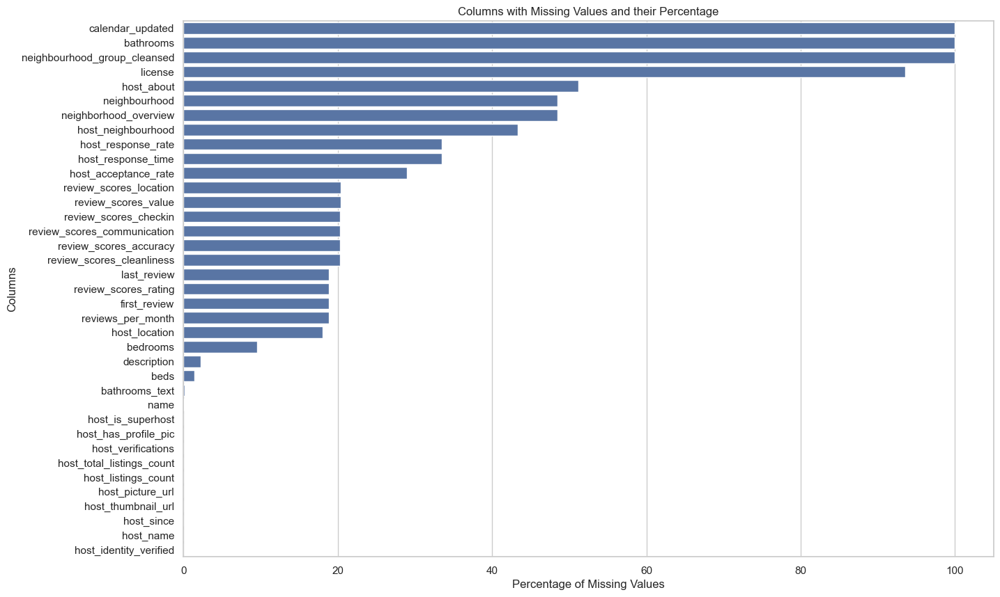

In [18]:
# Check missing values by using isnull method
missing_values = df.isnull().sum() / len(df) * 100
missing_values = missing_values[missing_values > 0].sort_values(ascending=False)

# Plotting the missing values
plt.figure(figsize=(15, 10))
sns.barplot(x=missing_values.values, y=missing_values.index)
plt.xlabel("Percentage of Missing Values")
plt.ylabel("Columns")
plt.title("Columns with Missing Values and their Percentage")
plt.show()

We will need a way to deal with the null values by either dropping or imputing. we can drop the 100% null values right away after checking

In [19]:
# Check null for calender updated
df_combined["calendar_updated"].isnull().sum() # no values

65435

In [20]:
# Check null for bathrooms
df_combined["bathrooms"].isnull().sum() # no values

65435

In [21]:
# Check null for neighbourhood_group_cleansed
df_combined["neighbourhood_group_cleansed"].isnull().sum() # no values

65435

In [22]:
# Checkout the names of the columns
df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [23]:
# Drop the columns that is not supportive in the dataset right away 
df_combined.drop(['scrape_id', 'last_scraped', 'source','picture_url',"calendar_updated",'bathrooms','neighbourhood_group_cleansed'],axis = 1, inplace = True)

In [24]:
# Check the shape
df_combined.shape  # We have now reduced the columns from 75 to 68

(65435, 68)

In [25]:
# Check Dataframe info again
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65435 entries, 0 to 353481
Data columns (total 68 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            65435 non-null  int64  
 1   listing_url                                   65435 non-null  object 
 2   name                                          65431 non-null  object 
 3   description                                   64795 non-null  object 
 4   neighborhood_overview                         25992 non-null  object 
 5   host_id                                       65435 non-null  int64  
 6   host_url                                      65435 non-null  object 
 7   host_name                                     65432 non-null  object 
 8   host_since                                    65432 non-null  object 
 9   host_location                                 40933 non-null  obj

### Lets convert the data types of some variables

In [26]:
# Check host since column
df_combined["host_since"].head()

0    2008-08-08
1    2009-06-22
2    2010-11-29
3    2012-12-30
4    2010-04-25
Name: host_since, dtype: object

In [27]:
# Convert host since to datetime
df_combined["host_since"] = pd.to_datetime(df_combined["host_since"]) # use pandas datetime
df_combined["host_since"].info() # it is converted to datetime

<class 'pandas.core.series.Series'>
Index: 65435 entries, 0 to 353481
Series name: host_since
Non-Null Count  Dtype         
--------------  -----         
65432 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 1022.4 KB


In [28]:
# Convert the price column from string to float
df_combined["price"] = df_combined["price"].str.replace("$","") # replace $ with blank forst

In [29]:
# Convert string to float after removing $ sign
df_combined["price"] = df_combined["price"].str.replace(",","").astype('float') 

In [30]:
# Check Price column 
df_combined["price"]

0         469.0
1         102.0
2          60.0
3          88.0
4         338.0
          ...  
353477     90.0
353478    188.0
353479     68.0
353480    136.0
353481     90.0
Name: price, Length: 65435, dtype: float64

In [31]:
# Check statistics for price column
df_combined["price"].describe()  

count     65435.000000
mean        186.342780
std        1049.830233
min           0.000000
25%          79.000000
50%         119.000000
75%         194.000000
max      135613.000000
Name: price, dtype: float64

The mean and median values look fine, but the max value however does not make sense, we will look into this to findout if it is an outliar or maybe even fake listing.

In [32]:
# Check the max price listing, since this looks like alot
df_combined[df_combined["price"]== 110114.000000]  # the listing does not exist, we will remove it later.

,id,listing_url,name,description,neighborhood_overview,host_id,host_url,host_name,host_since,host_location,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
156748,34706247,https://www.airbnb.com/rooms/34706247,Queen West 2bdrm +2bathCondo with Views.,-----<br />*Note. Even though currently listed...,The appartment in centered between all these g...,3578042,https://www.airbnb.com/users/show/3578042,Yian,2012-09-15,"Toronto, Canada",...,5.0,5.0,5.0,NaN,f,1,1,0,0,0.08


In [33]:
# since there are only 98 rows with listings more than 2000$, decided to exlcude those and see the distribution
df_combined = df_combined[df_combined["price"]<= 2000]

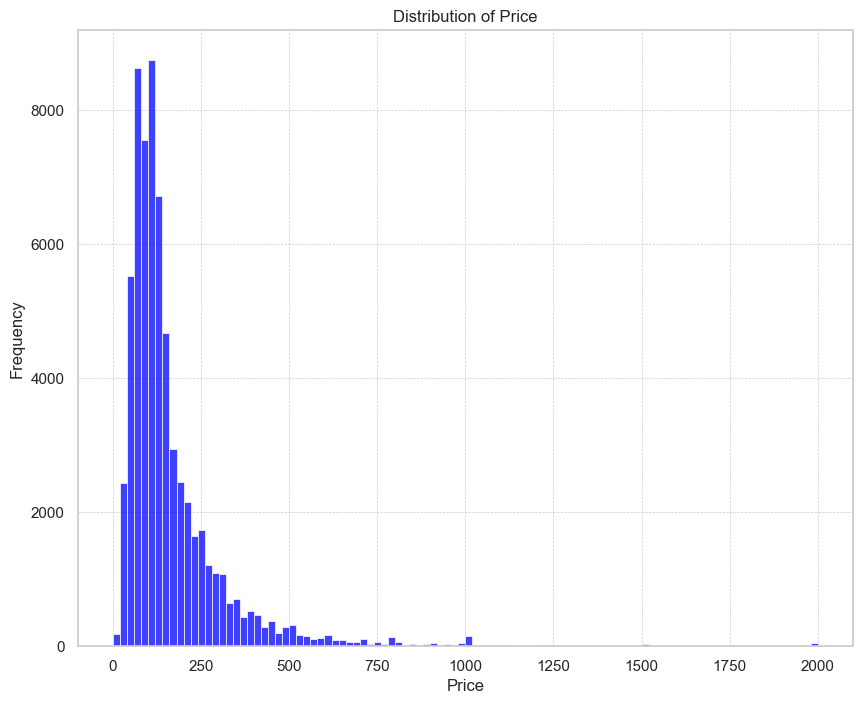

In [34]:
plt.figure(figsize = (10,8))
sns.histplot(x="price", data=df_combined, bins=100, color='blue')

# Adding labels and title
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.title("Distribution of Price")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

### It looks like the price is normally distributed with a right skew with mean value around 180$ 

### We can also see there are units around whole number like $1000$, $2000$

In [35]:
# Lets look at the bathroom variable

df_combined["bathrooms_text"].unique()

array(['3 baths', '1.5 baths', '1 bath', '2 baths', '1 shared bath',
       '1 private bath', '1.5 shared baths', 'Half-bath', '0 baths',
       '2.5 baths', '4 baths', '5 baths', '2 shared baths', '3.5 baths',
       '3 shared baths', '4.5 baths', '5.5 baths', nan, '0 shared baths',
       '6.5 baths', 'Shared half-bath', '2.5 shared baths',
       '4.5 shared baths', '6 baths', 'Private half-bath',
       '4 shared baths', '3.5 shared baths', '8 baths', '8.5 baths',
       '7.5 baths', '8 shared baths', '9 baths', '5 shared baths',
       '7 baths', '11.5 baths'], dtype=object)

In [36]:
# We are going to create a new column bathroom_num by extracting from bathroom_text
df_combined['bathroom_num'] = df_combined['bathrooms_text'].str.extract(r'(\d+\.?\d?)').astype(float)

# Handle special cases
df_combined.loc[df_combined['bathroom_num'].isin(['Half-bath', 'Shared half-bath', 'Private half-bath']), 'bathroom_num'] = 0.5

# Handle NaN values if you want to fill with a specific value (e.g., 0)
df_combined['bathroom_num'].fillna(0, inplace=True)

In [37]:
# Check bathroom_num values 
df_combined['bathroom_num'].head()

0    3.0
1    1.5
2    1.0
3    1.0
4    1.0
Name: bathroom_num, dtype: float64

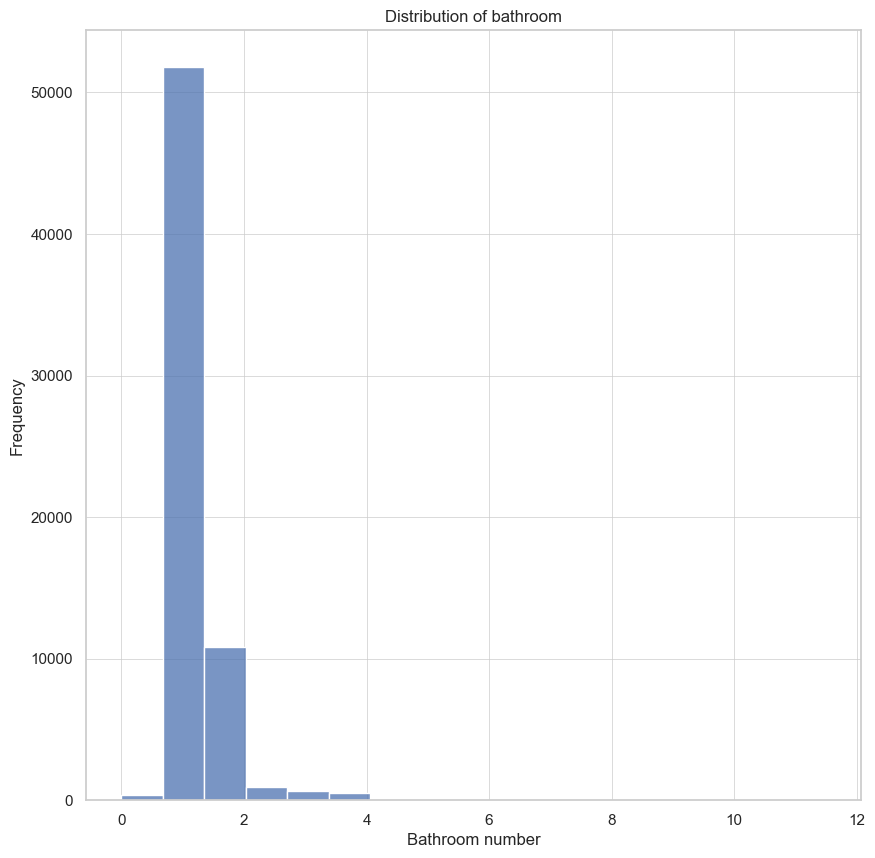

In [38]:
# Plot bathroom_num histogram to see distribution
plt.figure(figsize = (10,10))
sns.histplot(x = "bathroom_num", data = df_combined)
plt.xlabel("Bathroom number")
plt.ylabel("Frequency")
plt.title("Distribution of bathroom")
plt.grid(True, which='both', linestyle='-', linewidth=0.5)
plt.show()

Most units have either 1 or 1.5 bathrooms

In [39]:
# Extract only numeric columns 
numeric_columns_df = df_combined.select_dtypes(include=['int','float'])

In [40]:
# Checkout the df
numeric_columns_df.head()

,id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bedrooms,beds,price,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_num
0,1419,1565,1.0,1.0,43.64590,-79.42423,10,5.0,7.0,469.0,...,5.00,5.00,5.00,5.00,1,1,0,0,0.07,3.0
1,8077,22795,2.0,3.0,43.64080,-79.37673,2,NaN,1.0,102.0,...,4.87,4.90,4.92,4.83,2,1,1,0,0.99,1.5
2,387077,304551,9.0,16.0,43.66143,-79.40883,1,NaN,1.0,60.0,...,4.33,4.67,4.33,4.67,7,1,6,0,0.02,1.0
3,864193,4534248,1.0,1.0,43.78345,-79.44525,2,1.0,1.0,88.0,...,NaN,NaN,NaN,NaN,1,0,1,0,NaN,1.0
4,26654,113345,5.0,10.0,43.64608,-79.39032,4,1.0,2.0,338.0,...,4.63,4.76,4.85,4.66,4,4,0,0,0.27,1.0


Text(0.5, 1.0, 'AirBnB features Correlation')

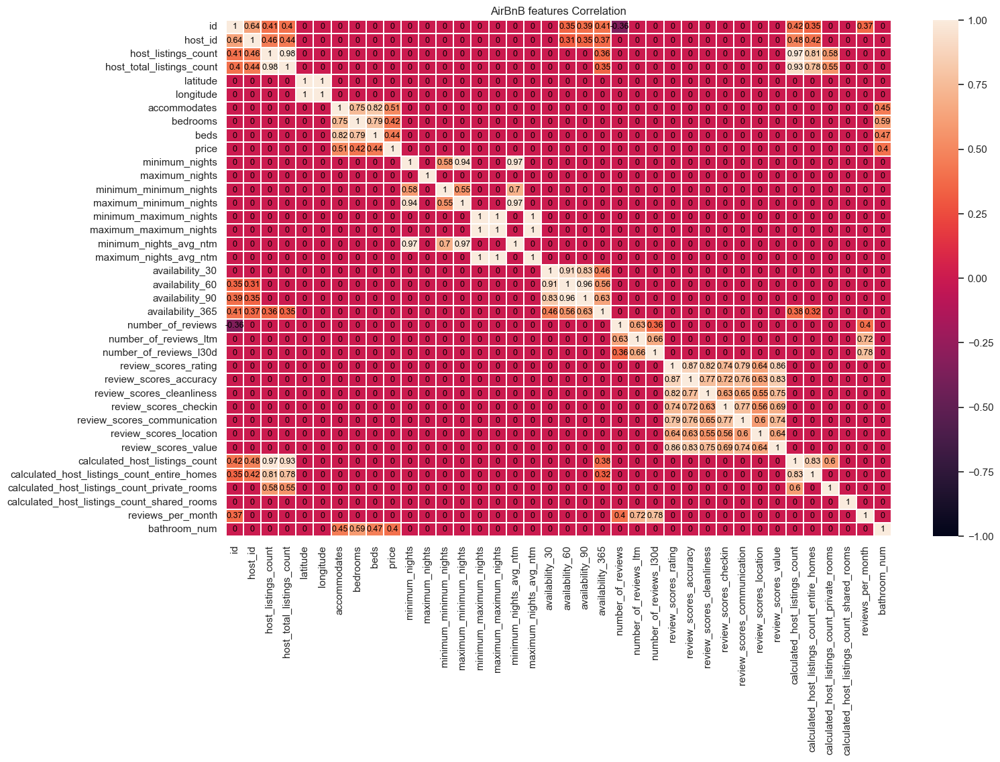

In [41]:
# Plot heatmap showing the correlation of all the features in the dataset

plt.figure( figsize = (16,10))
# Heatmap for all the remaining numerical data including the taget 'Price'
# Define the heatmap parameters
pd.options.display.float_format = "{:,.2f}".format

# Define correlation matrix
corr_matrix = numeric_columns_df.corr()

# Replace correlation < |0.3| by 0 for a better visibility
corr_matrix[(corr_matrix < 0.3) & (corr_matrix > -0.3)] = 0

# plot the heatmap
sns.heatmap(corr_matrix, vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot_kws={"size": 9, "color": "black"},annot=True)
plt.title("AirBnB features Correlation")

### We want to look more into the relationships between price and highly correlated variables to see if there is a linear relationship

In [42]:
# Checkout the correlation of variables to price ( our terget variable)
corr =numeric_columns_df.corr()["price"].sort_values(ascending = False)[1:7] 
corr

accommodates      0.51
beds              0.44
bedrooms          0.42
bathroom_num      0.40
availability_30   0.16
availability_60   0.14
Name: price, dtype: float64

In [43]:
# numeric columns info
numeric_columns_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65285 entries, 0 to 353481
Data columns (total 38 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            65285 non-null  int64  
 1   host_id                                       65285 non-null  int64  
 2   host_listings_count                           65282 non-null  float64
 3   host_total_listings_count                     65282 non-null  float64
 4   latitude                                      65285 non-null  float64
 5   longitude                                     65285 non-null  float64
 6   accommodates                                  65285 non-null  int64  
 7   bedrooms                                      49987 non-null  float64
 8   beds                                          64771 non-null  float64
 9   price                                         65285 non-null  flo

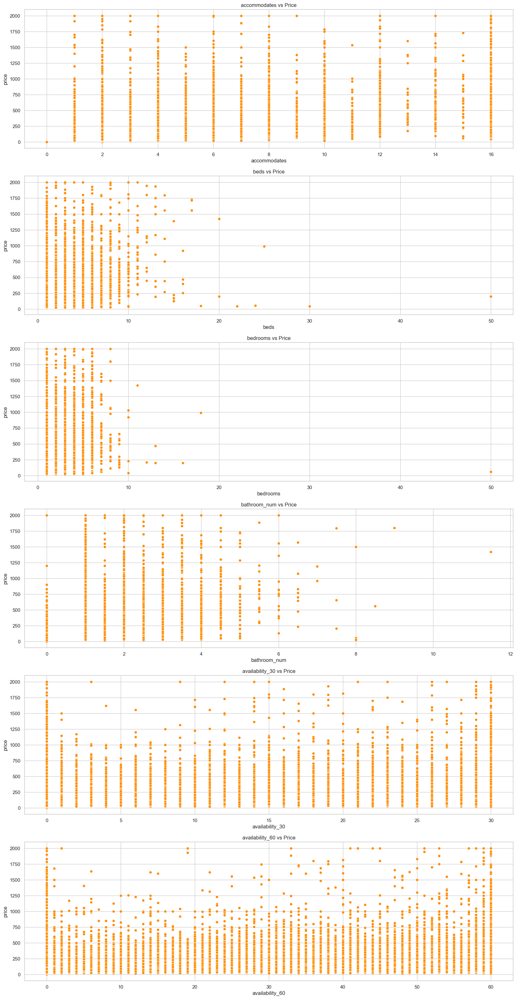

In [44]:
f,ax = plt.subplots(nrows = 6,ncols = 1, figsize = (20,40))
for i,col in enumerate(corr.index):    
    sns.scatterplot(x = col, y = "price", data = numeric_columns_df, ax = ax[i], color = 'darkorange')
    ax[i].set_title(f'{col} vs Price')

#### There is no linear relationship between the most correlated features and Price

### Checking out the different features to understand the data

In [45]:
# Highest correlated variable to Price
df_combined["accommodates"].describe()  # Basically how many person the unit accomodates, median is 2

count   65,285.00
mean         3.16
std          2.16
min          0.00
25%          2.00
50%          2.00
75%          4.00
max         16.00
Name: accommodates, dtype: float64

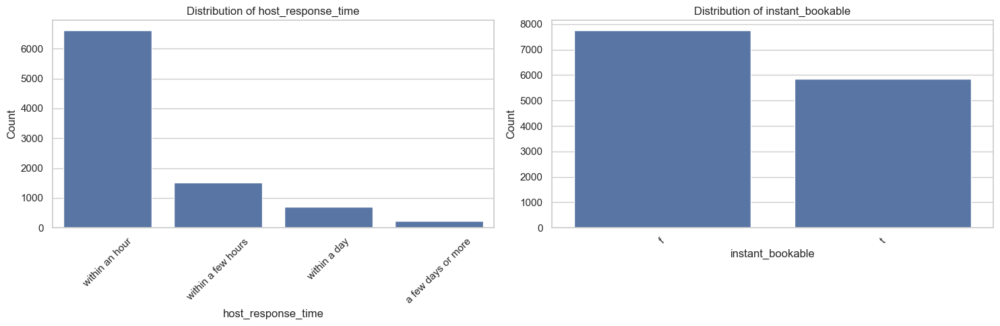

In [46]:
categorical_columns = ['host_response_time', 'instant_bookable']

# Plotting the distributions
plt.figure(figsize=(15, 5))
for i, column in enumerate(categorical_columns, 1):
    plt.subplot(1, 2, i)
    sns.countplot(data=df, x=column, order=df[column].value_counts().index)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.tight_layout()

plt.show()

### We can see most hosts reply within an hour and most have instant bookable feature

Text(0.5, 1.0, 'Distribution of bedroom')

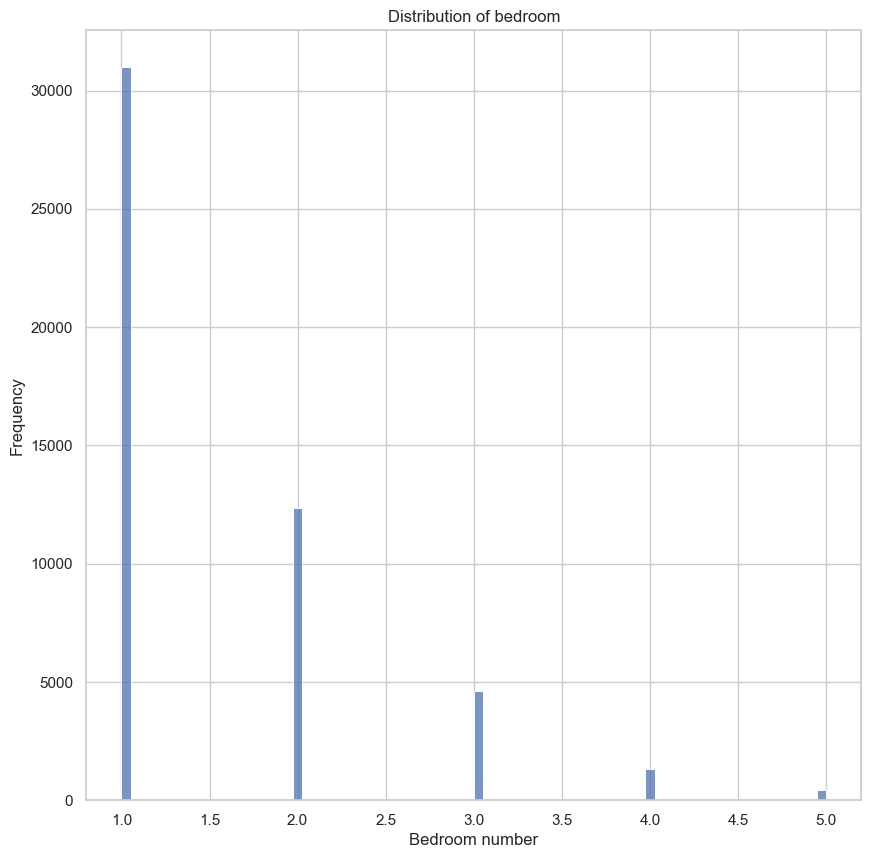

In [47]:
# plot bedroom distribution less that or equal to 5
plt.figure(figsize = (10,10))
sns.histplot(x = "bedrooms", data = df_combined[df_combined["bedrooms"]<=5])
plt.xlabel("Bedroom number")
plt.ylabel("Frequency")
plt.title("Distribution of bedroom")

#### Most units have 1 bedroom

In [48]:
### Check the mean prices for different bedrooms
df_combined.groupby("bedrooms")["price"].mean()

bedrooms
1.00      139.42
2.00      223.57
3.00      289.27
4.00      401.98
5.00      577.33
6.00      697.18
7.00      635.63
8.00      676.46
9.00      372.54
10.00     555.75
11.00   1,422.00
12.00     211.00
13.00     334.00
16.00     199.00
18.00     990.00
50.00      60.00
Name: price, dtype: float64

According to CP24.com
- Average one bedroom apartment in Toronto goes for 2600, per day rate assuming 30days in a month gives 87
- Average two bedroom apartment in Toronto goes for 3413, per day rate assuming 30days in a month gives 114


In [49]:
# 1 and 2 bedroom price/cost ratio

print(f" Mean Price/Cost ratio for 1bedroom unit is : {145.95/87}")
print(f" Mean Price/Cost ratio for 2bedroom unit is : {241.31/114}")

 Mean Price/Cost ratio for 1bedroom unit is : 1.6775862068965517
 Mean Price/Cost ratio for 2bedroom unit is : 2.1167543859649123


#### Assuming everything equal like occupancy, it is better for hosts to rent out 2bedroom apartment as they make 2X more than 1.67X for 1bedroom

In [50]:
# Plot longitude and latitude
fig = px.scatter_mapbox(df_combined, 
                        lat='latitude', 
                        lon='longitude', 
                        color='price',
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        size_max=15, 
                        zoom=10, 
                        mapbox_style="carto-positron")

fig.show()

## Summary till now

We have different datatypes: 
    
  - Ordinal Categorical Columns: eg "Host_response_time" - We will deal with ordinal categorical values diffferently
    
  - Categorical Columns:  name, description, neighborhood_overview, host_name
    
  - Binary category: host_is_superhost, instant_bookable, has_availability
    
  - Numerical:
    
       - ID based: id, host_id
       - Listing details: latitude, longitude, accommodates, bathrooms, bedrooms
        
        


## Whats next?

#### Deal with null values

We will deal with null values by either imputing or dropping

#### Deal with outliers:

We will deal with outlier values by first checking if its part of the normal distribution if not drop

#### Deal with Nominal categorical values

We will deal with nominal categorical values by converting it to dummy variables

#### Deal with Ordinal categorical values

We will change if possible to some number order like (0,1,2,3)

#### Feature engineer columns

- We can deal with the reviews dataset using TD_IDF, word embedding techniques to find value 

- We can use 'host_since' column to derive 'host tenure' in years 


#### Baseline Model

We will train linear regression model as baseline model. 

In [51]:
df_combined.head()

,id,listing_url,name,description,neighborhood_overview,host_id,host_url,host_name,host_since,host_location,...,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_num
0,1419,https://www.airbnb.com/rooms/1419,Home in Toronto · ★5.0 · 5 bedrooms · 7 beds ·...,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,1565,https://www.airbnb.com/users/show/1565,Alexandra,2008-08-08,"Vancouver, Canada",...,5.00,5.00,NaN,f,1,1,0,0,0.07,3.00
1,8077,https://www.airbnb.com/rooms/8077,Rental unit in Toronto · ★4.84 · 1 bedroom · 1...,Guest room in a luxury condo with access to al...,NaN,22795,https://www.airbnb.com/users/show/22795,Kathie & Larry,2009-06-22,"Toronto, Canada",...,4.92,4.83,NaN,f,2,1,1,0,0.99,1.50
2,387077,https://www.airbnb.com/rooms/387077,Rental unit in Toronto · ★4.33 · 1 bedroom · 1...,<b>The space</b><br />Annex House provides ful...,NaN,304551,https://www.airbnb.com/users/show/304551,Kintoo,2010-11-29,"Toronto, Canada",...,4.33,4.67,NaN,f,7,1,6,0,0.02,1.00
3,864193,https://www.airbnb.com/rooms/864193,Rental unit in Toronto · 1 bedroom · 1 bed · 1...,<b>The space</b><br />It's 2 Bedrooms specious...,NaN,4534248,https://www.airbnb.com/users/show/4534248,Nida,2012-12-30,"Toronto, Canada",...,NaN,NaN,NaN,f,1,0,1,0,NaN,1.00
4,26654,https://www.airbnb.com/rooms/26654,Condo in Toronto · ★4.78 · 1 bedroom · 2 beds ...,"CN Tower, TIFF Bell Lightbox, Metro Convention...",There's a reason they call it the Entertainmen...,113345,https://www.airbnb.com/users/show/113345,Adela,2010-04-25,"Toronto, Canada",...,4.85,4.66,NaN,f,4,4,0,0,0.27,1.00


## SPRINT 2

In [52]:
df_combined.head()

,id,listing_url,name,description,neighborhood_overview,host_id,host_url,host_name,host_since,host_location,...,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_num
0,1419,https://www.airbnb.com/rooms/1419,Home in Toronto · ★5.0 · 5 bedrooms · 7 beds ·...,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,1565,https://www.airbnb.com/users/show/1565,Alexandra,2008-08-08,"Vancouver, Canada",...,5.00,5.00,NaN,f,1,1,0,0,0.07,3.00
1,8077,https://www.airbnb.com/rooms/8077,Rental unit in Toronto · ★4.84 · 1 bedroom · 1...,Guest room in a luxury condo with access to al...,NaN,22795,https://www.airbnb.com/users/show/22795,Kathie & Larry,2009-06-22,"Toronto, Canada",...,4.92,4.83,NaN,f,2,1,1,0,0.99,1.50
2,387077,https://www.airbnb.com/rooms/387077,Rental unit in Toronto · ★4.33 · 1 bedroom · 1...,<b>The space</b><br />Annex House provides ful...,NaN,304551,https://www.airbnb.com/users/show/304551,Kintoo,2010-11-29,"Toronto, Canada",...,4.33,4.67,NaN,f,7,1,6,0,0.02,1.00
3,864193,https://www.airbnb.com/rooms/864193,Rental unit in Toronto · 1 bedroom · 1 bed · 1...,<b>The space</b><br />It's 2 Bedrooms specious...,NaN,4534248,https://www.airbnb.com/users/show/4534248,Nida,2012-12-30,"Toronto, Canada",...,NaN,NaN,NaN,f,1,0,1,0,NaN,1.00
4,26654,https://www.airbnb.com/rooms/26654,Condo in Toronto · ★4.78 · 1 bedroom · 2 beds ...,"CN Tower, TIFF Bell Lightbox, Metro Convention...",There's a reason they call it the Entertainmen...,113345,https://www.airbnb.com/users/show/113345,Adela,2010-04-25,"Toronto, Canada",...,4.85,4.66,NaN,f,4,4,0,0,0.27,1.00


## Look into each string columns and clean the dataset to make it model ready

In [53]:
df_combined.select_dtypes(object).columns

Index(['listing_url', 'name', 'description', 'neighborhood_overview',
       'host_url', 'host_name', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed',
       'property_type', 'room_type', 'bathrooms_text', 'amenities',
       'has_availability', 'calendar_last_scraped', 'first_review',
       'last_review', 'license', 'instant_bookable'],
      dtype='object')

In [54]:
# Checkout the binary columns
df_combined[['host_has_profile_pic','host_is_superhost','host_identity_verified','has_availability']].head()

,host_has_profile_pic,host_is_superhost,host_identity_verified,has_availability
0,t,f,t,t
1,t,f,f,f
2,t,t,t,t
3,t,f,t,f
4,t,f,t,t


Since they are all binary categorical columns, we will convert the t and f values to 1 and 0 inorder to feed it in the ML model.

In [55]:
# Convert the values to binary to represent t and f
df_combined[['host_has_profile_pic','host_is_superhost','host_identity_verified','has_availability','instant_bookable']]= df_combined[['host_has_profile_pic','host_is_superhost','host_identity_verified','has_availability','instant_bookable']].replace({"t":1,"f":0})

In [56]:
df_combined[['host_has_profile_pic','host_is_superhost','host_identity_verified','has_availability']].head()

,host_has_profile_pic,host_is_superhost,host_identity_verified,has_availability
0,1.00,0.00,1.00,1
1,1.00,0.00,0.00,0
2,1.00,1.00,1.00,1
3,1.00,0.00,1.00,0
4,1.00,0.00,1.00,1


### `host_since` Column

In [57]:
# Checkout the dataframe info
df_combined["host_since"].info()

<class 'pandas.core.series.Series'>
Index: 65285 entries, 0 to 353481
Series name: host_since
Non-Null Count  Dtype         
--------------  -----         
65282 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 1020.1 KB


In [58]:
# Checkout the dataframe
df_combined["host_since"].head() #drop

0   2008-08-08
1   2009-06-22
2   2010-11-29
3   2012-12-30
4   2010-04-25
Name: host_since, dtype: datetime64[ns]

In [59]:
# Get the tenure period out of the host since and drop the host since column
df_combined["Tenure"]= 2023 - df_combined["host_since"].dt.year
df_combined.drop("host_since",axis = 1, inplace=True)
df_combined["Tenure"].head()

0   15.00
1   14.00
2   13.00
3   11.00
4   13.00
Name: Tenure, dtype: float64

### `host_about` Column

In [60]:
df_combined['host_about'].head() #drop

0    I live in Vancouver, Canada with my husband an...
1    My husband and I have been airbnb host for alm...
2    We are privileged to be the owners of this his...
3              I'm Dr. Nida who is renting a nice room
4    Welcome to Toronto! \r\n\r\nAfter our first me...
Name: host_about, dtype: object

### `host_response_time` Column

In [61]:
# Checkout the host_response_time column
df_combined["host_response_time"].unique() # There are four unique values

array([nan, 'a few days or more', 'within an hour', 'within a few hours',
       'within a day'], dtype=object)

#### Interpretation

Since there is an order to the column, as replying within a few hours is better than a dew days, we will do ordinal encoding to encode more information for our model.

In [62]:
# Replace the string categories into ordinal integer 
response_time_dict = {'a few days or more':1,'within a day':2,'within a few hours':3,'within an hour':4}
df_combined["host_response_time"] = df_combined["host_response_time"].replace(response_time_dict)
df_combined["host_response_time"].head()

0    NaN
1   1.00
2   4.00
3    NaN
4   3.00
Name: host_response_time, dtype: float64

### `host_response_rate` Column

In [63]:
# Checkout the host response rate column
df_combined['host_response_rate'].isnull().sum() # 7064 null values

13152

In [64]:
# Checkout the `host_response_rate` column 
df_combined['host_response_rate'].head(3)

0     NaN
1      0%
2    100%
Name: host_response_rate, dtype: object

In [65]:
# Check the info 
df_combined['host_response_rate'].info() # It is string type and has % sign

<class 'pandas.core.series.Series'>
Index: 65285 entries, 0 to 353481
Series name: host_response_rate
Non-Null Count  Dtype 
--------------  ----- 
52133 non-null  object
dtypes: object(1)
memory usage: 1020.1+ KB


#### Interpretation

- It has % sign and object values, so we will remove the % and also change the dtype into int

In [66]:
# Remove the % sign, convert the datatype into a float and then convert it into percentage
df_combined['host_response_rate'] = df_combined['host_response_rate'].str.rstrip("%").astype(float)/100
df_combined['host_response_rate'].head()

0    NaN
1   0.00
2   1.00
3    NaN
4   1.00
Name: host_response_rate, dtype: float64

### `host_acceptance_rate` Column

In [67]:
# Checkout the `host_acceptance_rate` column 
df_combined['host_acceptance_rate'].head(3)

0    NaN
1    NaN
2    93%
Name: host_acceptance_rate, dtype: object

#### Interpretation

- It has % sign and object values, so we will remove the % and also change the dtype into int

In [68]:
# Remove the % sign, convert the datatype into a float and then convert it into percentage
df_combined['host_acceptance_rate'] = df_combined['host_acceptance_rate'].str.rstrip("%").astype(float)/100
df_combined['host_acceptance_rate'].head()

0    NaN
1    NaN
2   0.93
3    NaN
4   0.22
Name: host_acceptance_rate, dtype: float64

### `host_neighbourhood` Column

In [69]:
# Checkout the `host_neighbourhood` column 
df_combined['host_neighbourhood'].nunique() # look into this

469

### `license` Column

In [70]:
df_combined['license'].head()

0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
Name: license, dtype: object

In [71]:
df_combined['license'] = df_combined['license'].apply(lambda x: 1 if type(x)==str else 0)
df_combined['license'].head()

0    0
1    0
2    0
3    0
4    0
Name: license, dtype: int64

In [72]:
df_combined['license'].value_counts()

license
0    41324
1    23961
Name: count, dtype: int64

In [73]:
df_combined.select_dtypes(int)

,id,host_id,accommodates,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,has_availability,...,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,1419,1565,10,28,730,28,28,730,730,1,...,0,7,0,0,0,0,1,1,0,0
1,8077,22795,2,180,365,180,180,365,365,0,...,0,169,0,0,0,0,2,1,1,0
2,387077,304551,1,90,1125,90,90,1125,1125,1,...,246,3,2,0,0,0,7,1,6,0
3,864193,4534248,2,28,1125,28,28,1125,1125,0,...,0,0,0,0,0,0,1,0,1,0
4,26654,113345,4,28,1125,28,28,1125,1125,1,...,39,42,1,0,0,0,4,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353477,23623745,129631046,2,1,1125,1,1,1125,1125,1,...,86,178,33,3,0,0,3,1,2,0
353478,670156236403890655,374110222,2,2,365,2,2,365,365,1,...,350,4,4,1,0,0,1,1,0,0
353479,20697173,148135406,1,2,7,2,2,7,7,1,...,21,195,54,7,1,0,1,1,0,0
353480,670513785200359144,30013120,2,1,7,1,2,1125,1125,1,...,89,8,8,4,0,0,1,1,0,0


In [74]:
df_combined.select_dtypes(object)

,listing_url,name,description,neighborhood_overview,host_url,host_name,host_location,host_about,host_thumbnail_url,host_picture_url,...,host_verifications,neighbourhood,neighbourhood_cleansed,property_type,room_type,bathrooms_text,amenities,calendar_last_scraped,first_review,last_review
0,https://www.airbnb.com/rooms/1419,Home in Toronto · ★5.0 · 5 bedrooms · 7 beds ·...,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,https://www.airbnb.com/users/show/1565,Alexandra,"Vancouver, Canada","I live in Vancouver, Canada with my husband an...",https://a0.muscache.com/im/pictures/user/7aeea...,https://a0.muscache.com/im/pictures/user/7aeea...,...,"['email', 'phone']","Toronto, Ontario, Canada",Little Portugal,Entire home,Entire home/apt,3 baths,"[""Wifi"", ""Air conditioning"", ""Shampoo"", ""Dryer...",2023-09-04,2015-07-19,2017-12-04
1,https://www.airbnb.com/rooms/8077,Rental unit in Toronto · ★4.84 · 1 bedroom · 1...,Guest room in a luxury condo with access to al...,NaN,https://www.airbnb.com/users/show/22795,Kathie & Larry,"Toronto, Canada",My husband and I have been airbnb host for alm...,https://a0.muscache.com/im/pictures/user/9a077...,https://a0.muscache.com/im/pictures/user/9a077...,...,"['email', 'phone']",NaN,Waterfront Communities-The Island,Private room in rental unit,Private room,1.5 baths,"[""Wifi"", ""Air conditioning"", ""Shampoo"", ""Pool""...",2023-09-04,2009-08-20,2013-08-27
2,https://www.airbnb.com/rooms/387077,Rental unit in Toronto · ★4.33 · 1 bedroom · 1...,<b>The space</b><br />Annex House provides ful...,NaN,https://www.airbnb.com/users/show/304551,Kintoo,"Toronto, Canada",We are privileged to be the owners of this his...,https://a0.muscache.com/im/users/304551/profil...,https://a0.muscache.com/im/users/304551/profil...,...,"['email', 'phone']",NaN,University,Private room in rental unit,Private room,1 bath,"[""Wifi"", ""TV with standard cable"", ""Lock on be...",2023-09-04,2013-08-11,2023-02-28
3,https://www.airbnb.com/rooms/864193,Rental unit in Toronto · 1 bedroom · 1 bed · 1...,<b>The space</b><br />It's 2 Bedrooms specious...,NaN,https://www.airbnb.com/users/show/4534248,Nida,"Toronto, Canada",I'm Dr. Nida who is renting a nice room,https://a0.muscache.com/im/users/4534248/profi...,https://a0.muscache.com/im/users/4534248/profi...,...,"['email', 'phone']",NaN,Newtonbrook West,Private room in rental unit,Private room,1 bath,"[""Wifi"", ""Pool"", ""TV with standard cable"", ""He...",2023-09-04,NaN,NaN
4,https://www.airbnb.com/rooms/26654,Condo in Toronto · ★4.78 · 1 bedroom · 2 beds ...,"CN Tower, TIFF Bell Lightbox, Metro Convention...",There's a reason they call it the Entertainmen...,https://www.airbnb.com/users/show/113345,Adela,"Toronto, Canada",Welcome to Toronto! \r\n\r\nAfter our first me...,https://a0.muscache.com/im/users/113345/profil...,https://a0.muscache.com/im/users/113345/profil...,...,"['email', 'phone', 'work_email']","Toronto, Ontario, Canada",Waterfront Communities-The Island,Entire condo,Entire home/apt,1 bath,"[""City skyline view"", ""Patio or balcony"", ""Exe...",2023-09-04,2011-01-05,2023-08-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353477,https://www.airbnb.com/rooms/23623745,The treehouse Den. A cozy place for composers,Arrival: Free and easy parking on both sides o...,"Nearby: Library (Multicultural Library), St. L...",https://www.airbnb.com/users/show/129631046,Rebecca,"Montreal, Canada",Je suis étudiante à l’Uqam. J’ai commencé à a...,https://a0.muscache.com/im/pictures/user/bc6a6...,https://a0.muscache.com/im/pictures/user/bc6a6...,...,"['email', 'phone']","Laval, Québec, Canada",Ahuntsic-Cartierville,Entire rental unit,Entire home/apt,1 bath,"[""Single level home"", ""Refrigerator"", ""Microwa...",2022-09-13,2019-03-30,2022-09-03
353478,https://www.airbnb.com/rooms/670156236403890655,Condo Moderne,"Kick back and relax in this calm, stylish space.",NaN,https://www.airbnb.com/u

In [75]:
df_combined.drop(['id','listing_url','name','description','neighborhood_overview',
                 'host_id','host_url','host_name','host_location','host_thumbnail_url',
                 'host_picture_url','neighbourhood','bathrooms_text','calendar_last_scraped',
                 'first_review','last_review','host_neighbourhood', 'host_about','property_type',
                  'host_listings_count'], axis = 1, inplace= True)

- Since room_type and property_type are similar column, we will drop the property time and create one hot encoding for room_type
- Since 'host_total_listings_count' and 'host_listings_count' are similar column, we will drop the 'host_listings_count' since that information is included in total host listings count

In [76]:
df_combined.shape

(65285, 49)

## Cleaning (Deal with Outliers)

In [77]:
# Calculating IQR for 'price'
Q1 = df_combined['price'].quantile(0.25)
Q3 = df_combined['price'].quantile(0.75)
IQR = Q3 - Q1

# Defining outliers as anything outside of Q1 - 1.5 * IQR and Q3 + 1.5 * IQR
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Removing outliers from the original dataframe
df_combined = df_combined.loc[(df_combined['price'] >= lower_bound) & (df_combined['price'] <= upper_bound)]

# Confirm the new shape of the dataframe after removing outliers
df_combined.shape

(60300, 49)

# Cleaning (null values)

In [78]:
null_values_summary = df_combined.isnull().sum()[df_combined.isnull().sum()>0]
null_values_summary

host_response_time             12306
host_response_rate             12306
host_acceptance_rate           10579
host_is_superhost               2403
host_total_listings_count          3
host_verifications                 3
host_has_profile_pic               3
host_identity_verified             3
bedrooms                       15070
beds                             487
review_scores_rating           26198
review_scores_accuracy         26519
review_scores_cleanliness      26516
review_scores_checkin          26525
review_scores_communication    26519
review_scores_location         26527
review_scores_value            26526
reviews_per_month              26198
Tenure                             3
dtype: int64

#### Host Response Time

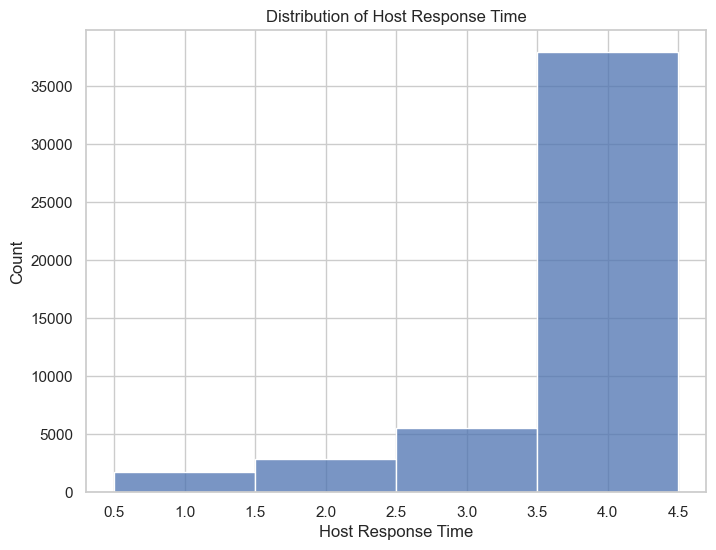

In [79]:
plt.figure(figsize=(8, 6))  # Set the figure size
sns.histplot(df_combined['host_response_time'], bins=4, discrete=True)  # Plot the histogram with discrete bins

# Set the labels and title
plt.title('Distribution of Host Response Time')  # Title of the histogram
plt.xlabel('Host Response Time')  # X-axis label
plt.ylabel('Count')  # Y-axis label

# Show the plot
plt.show()

In [80]:
df_combined['host_response_time'].median()

4.0

We will use mode as that represents the best value to fill null values

#### Host Response Rate

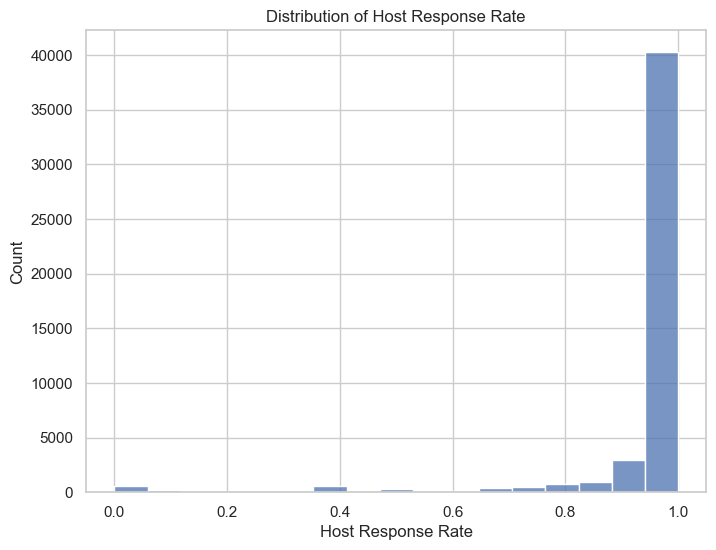

In [81]:
plt.figure(figsize=(8, 6))  # Set the figure size
sns.histplot(df_combined['host_response_rate'])  # Plot the histogram with discrete bins

# Set the labels and title
plt.title('Distribution of Host Response Rate')  # Title of the histogram
plt.xlabel('Host Response Rate')  # X-axis label
plt.ylabel('Count')  # Y-axis label

# Show the plot
plt.show()

In [82]:
df_combined['host_response_rate'].mean()

0.9481835229403675

We will use mean as that represents the best value to fill null values

#### host_acceptance_rate

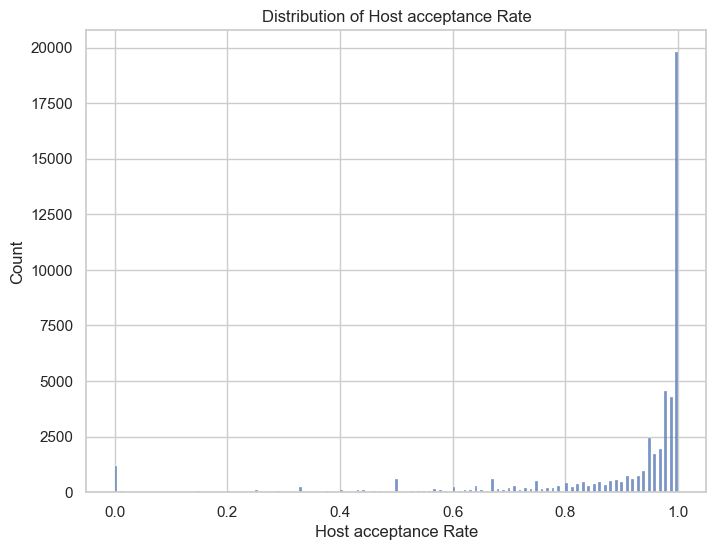

In [83]:
plt.figure(figsize=(8, 6))  # Set the figure size
sns.histplot(df_combined['host_acceptance_rate'])  # Plot the histogram with discrete bins

# Set the labels and title
plt.title('Distribution of Host acceptance Rate')  # Title of the histogram
plt.xlabel('Host acceptance Rate')  # X-axis label
plt.ylabel('Count')  # Y-axis label

# Show the plot
plt.show()

We will use mean as that represents the best value to fill null values

#### Host is superhost

In [84]:
df_combined["host_is_superhost"].describe()

count   57,897.00
mean         0.19
std          0.39
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          1.00
Name: host_is_superhost, dtype: float64

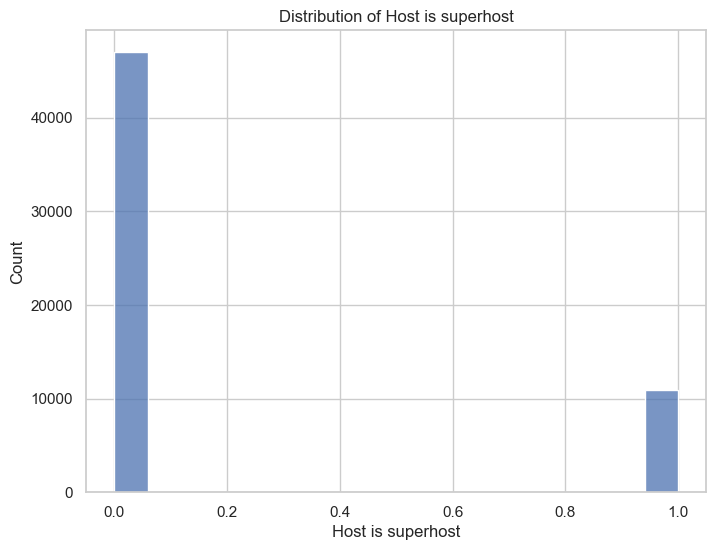

In [85]:
plt.figure(figsize=(8, 6))  # Set the figure size
sns.histplot(df_combined['host_is_superhost'])  # Plot the histogram with discrete bins

# Set the labels and title
plt.title('Distribution of Host is superhost')  # Title of the histogram
plt.xlabel('Host is superhost')  # X-axis label
plt.ylabel('Count')  # Y-axis label

# Show the plot
plt.show()

In [86]:
df_combined['host_is_superhost'].unique()

array([ 0.,  1., nan])

We will use mode as that represents the best value to fill null values

#### Bedrooms

In [87]:
df_combined["bedrooms"].unique()

array([nan,  1.,  3.,  2.,  4.,  9.,  5.,  6.,  7., 50.,  8., 12., 16.,
       13., 10.])

In [88]:
df_combined[df_combined["bedrooms"]==50]

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,...,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_num,Tenure
3387,NaN,NaN,NaN,0.00,1.00,"['email', 'phone']",1.00,0.00,South Parkdale,43.64,...,4.63,0,0,1,1,0,0,0.36,0.00,6.00


In [89]:
df_combined[df_combined["bedrooms"]==50]["price"]

3387   60.00
Name: price, dtype: float64

In [90]:
df_combined[df_combined["bedrooms"]==16]["price"]

249114   199.00
Name: price, dtype: float64

In [91]:
df_combined[df_combined["bedrooms"]==13]["price"]

249115   199.00
Name: price, dtype: float64

In [92]:
df_combined[df_combined["bedrooms"]==12]["price"]

201514   211.00
Name: price, dtype: float64

In [93]:
df_combined[df_combined["bedrooms"]==10]["price"]

258912    41.00
260640   230.00
Name: price, dtype: float64

<Axes: xlabel='bedrooms', ylabel='price'>

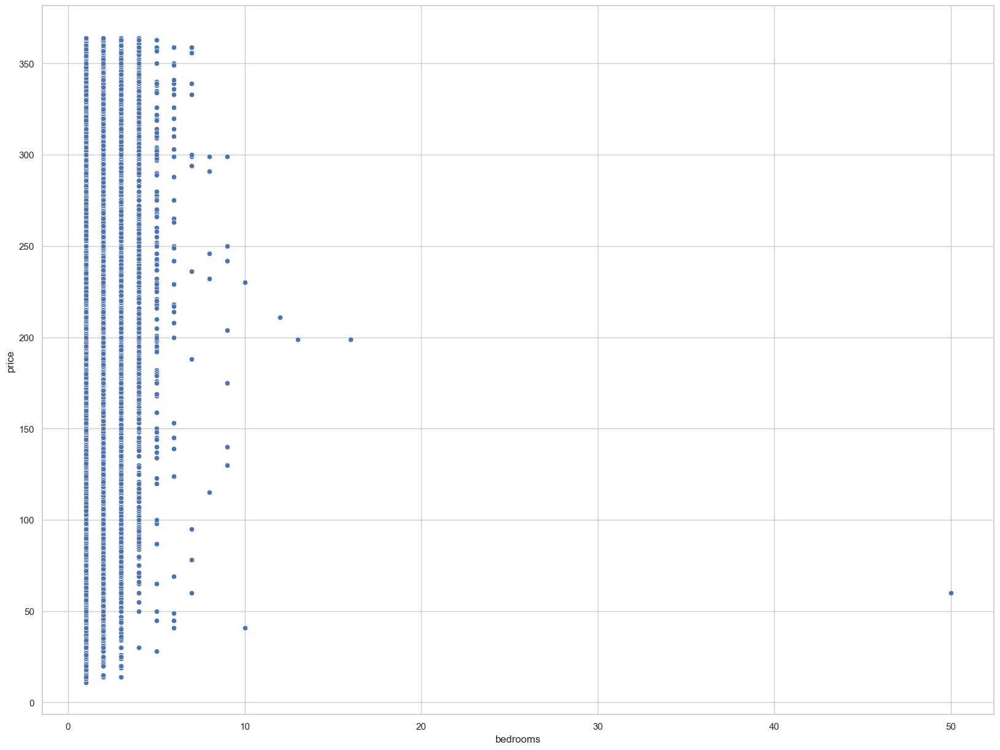

In [94]:
sns.scatterplot(df_combined, x = "bedrooms", y = "price")

In [95]:
df_combined = df_combined[~df_combined['bedrooms'].isin([10, 12, 13, 16, 50])]
df_combined.shape

(60294, 49)

In [96]:
df_combined["bedrooms"].median()

1.0

We will use the KNN imputer to impute null values for the bedroom

<Axes: xlabel='review_scores_rating', ylabel='Count'>

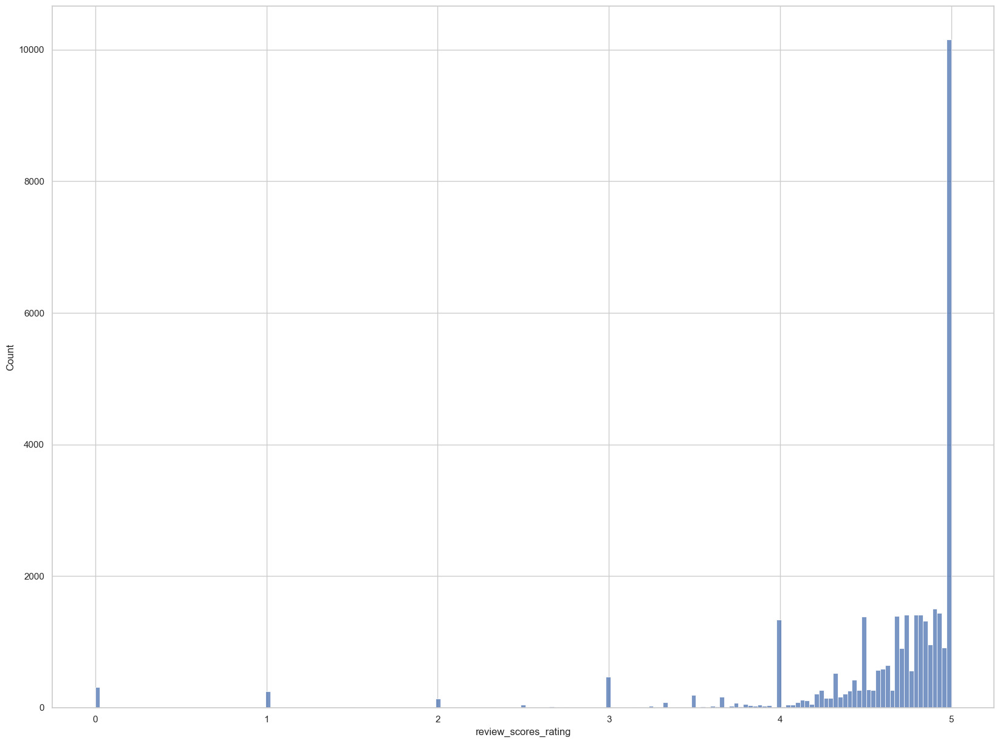

In [97]:
sns.histplot(df_combined["review_scores_rating"])

We will use the mean value for review_score to impute null values

In [98]:
# Imputing 'host_response_time' and 'host_is_superhost' with mode
mode_host_response_time = df_combined['host_response_time'].mode()[0]
mode_host_is_superhost = df_combined['host_is_superhost'].mode()[0]
df_combined['host_response_time'].fillna(mode_host_response_time, inplace=True)
df_combined['host_is_superhost'].fillna(mode_host_is_superhost, inplace=True)

# Imputing 'host_response_rate' and 'host_acceptance_rate' with mean
mean_host_response_rate = df_combined['host_response_rate'].mean()
mean_host_acceptance_rate = df_combined['host_acceptance_rate'].mean()
df_combined['host_response_rate'].fillna(mean_host_response_rate, inplace=True)
df_combined['host_acceptance_rate'].fillna(mean_host_acceptance_rate, inplace=True)

# Imputing 'review_scores_rating' with mean
mean_review_scores_rating = df_combined['review_scores_rating'].mean()
df_combined['review_scores_rating'].fillna(mean_review_scores_rating, inplace=True)

# Imputing 'beds' with median
median_beds = df_combined['beds'].median()
df_combined['beds'].fillna(median_beds, inplace=True)

# Dropping rows with null values for the specified columns
columns_to_drop = [
    'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 
    'host_identity_verified', 'Tenure'
]
df_combined.dropna(subset=columns_to_drop, inplace=True)

# Confirming the changes
null_values_after_imputation = df_combined.isnull().sum()
null_values_after_imputation


host_response_time                                  0
host_response_rate                                  0
host_acceptance_rate                                0
host_is_superhost                                   0
host_total_listings_count                           0
host_verifications                                  0
host_has_profile_pic                                0
host_identity_verified                              0
neighbourhood_cleansed                              0
latitude                                            0
longitude                                           0
room_type                                           0
accommodates                                        0
bedrooms                                        15069
beds                                                0
amenities                                           0
price                                               0
minimum_nights                                      0
maximum_nights              

In [99]:
review_score_columns = [
    'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
    'review_scores_communication', 'review_scores_location', 'review_scores_value'
]

for column in review_score_columns:
    mean_value = df_combined[column].mean()
    df_combined[column].fillna(mean_value, inplace=True)


In [100]:
mean_reviews_per_month = df_combined['reviews_per_month'].mean()
df_combined['reviews_per_month'].fillna(mean_reviews_per_month, inplace=True)


In [101]:
# Initialize the KNNImputer
imputer = KNNImputer(n_neighbors=5)

# We only want to impute the 'bedrooms' column, so we'll isolate it
bedrooms = df_combined[['bedrooms']]

# Fit the imputer and transform the 'bedrooms' column, then replace the original 'bedrooms' column
df_combined['bedrooms'] = imputer.fit_transform(bedrooms)

# Check for any remaining null values in the 'bedrooms' column
df_combined['bedrooms'].isnull().sum(), df_combined[['bedrooms']].head()

(0,
    bedrooms
 1      1.46
 2      1.46
 3      1.00
 4      1.00
 5      3.00)

**Since bedroom is an important feature to predict price, we first remove the outliers and then use KNN imputer to impute the values for the null**

In [102]:
df_combined.isnull().sum()

host_response_time                              0
host_response_rate                              0
host_acceptance_rate                            0
host_is_superhost                               0
host_total_listings_count                       0
host_verifications                              0
host_has_profile_pic                            0
host_identity_verified                          0
neighbourhood_cleansed                          0
latitude                                        0
longitude                                       0
room_type                                       0
accommodates                                    0
bedrooms                                        0
beds                                            0
amenities                                       0
price                                           0
minimum_nights                                  0
maximum_nights                                  0
minimum_minimum_nights                          0


# Feature Engineering

### `room_type` Column

In [103]:
df_combined["room_type"].value_counts(normalize=True)

room_type
Entire home/apt   0.70
Private room      0.29
Shared room       0.01
Hotel room        0.00
Name: proportion, dtype: float64

In [104]:
df_combined["room_type"].unique()

array(['Private room', 'Entire home/apt', 'Shared room', 'Hotel room'],
      dtype=object)

In [105]:
df_combined["room_type"].isnull().sum()

0

In [106]:
room_type_df = pd.get_dummies(df_combined["room_type"], drop_first=True, dtype=float, prefix='room_type')
room_type_df.head()

,room_type_Hotel room,room_type_Private room,room_type_Shared room
1,0.00,1.00,0.00
2,0.00,1.00,0.00
3,0.00,1.00,0.00
4,0.00,0.00,0.00
5,0.00,0.00,0.00


### `neighbourhood_cleansed` Column

In [107]:
df_combined["neighbourhood_cleansed"].value_counts(normalize=True).head(10)

neighbourhood_cleansed
Ville-Marie                           0.10
Trinity-Bellwoods                     0.08
Kensington-Chinatown                  0.08
Le Plateau-Mont-Royal                 0.08
Waterfront Communities-The Island     0.07
Le Sud-Ouest                          0.03
Côte-des-Neiges-Notre-Dame-de-Grâce   0.03
Rosemont-La Petite-Patrie             0.03
Wexford/Maryvale                      0.02
Mercier-Hochelaga-Maisonneuve         0.02
Name: proportion, dtype: float64

In [108]:
df_combined["neighbourhood_cleansed"].nunique()

174

In [109]:
# Find the top 10 most frequent categories in 'neighbourhood_cleansed'
top_10_neighbourhoods = df_combined["neighbourhood_cleansed"].value_counts().head(5).index.tolist()

# Create a new column 'neighbourhood_top_10' where all categories not in the top 10 are labeled as 'Other'
df_combined['neighbourhood'] = df_combined['neighbourhood_cleansed'].apply(lambda x: x if x in top_10_neighbourhoods else 'Other')

# Apply one-hot encoding to the new column
encoder = OneHotEncoder(sparse=False)
neighbourhood_one_hot = encoder.fit_transform(df_combined[['neighbourhood']])

# Create a df_combinedFrame with the one-hot encoded variables
neighbourhood_one_hot_df = pd.DataFrame(neighbourhood_one_hot, columns=encoder.get_feature_names_out())

# Display the one-hot encoded df_combinedFrame
neighbourhood_one_hot_df.head()

,neighbourhood_Kensington-Chinatown,neighbourhood_Le Plateau-Mont-Royal,neighbourhood_Other,neighbourhood_Trinity-Bellwoods,neighbourhood_Ville-Marie,neighbourhood_Waterfront Communities-The Island
0,0.00,0.00,0.00,0.00,0.00,1.00
1,0.00,0.00,1.00,0.00,0.00,0.00
2,0.00,0.00,1.00,0.00,0.00,0.00
3,0.00,0.00,0.00,0.00,0.00,1.00
4,0.00,0.00,1.00,0.00,0.00,0.00


### `host_verification` Column

In [110]:
df_combined["host_verifications"].head()

1                  ['email', 'phone']
2                  ['email', 'phone']
3                  ['email', 'phone']
4    ['email', 'phone', 'work_email']
5    ['email', 'phone', 'work_email']
Name: host_verifications, dtype: object

In [111]:
df_combined["host_verifications"].value_counts(normalize=True)

host_verifications
['email', 'phone']                   0.84
['phone']                            0.08
['email', 'phone', 'work_email']     0.07
['phone', 'work_email']              0.00
['email']                            0.00
[]                                   0.00
['email', 'work_email']              0.00
['work_email']                       0.00
['email', 'phone', 'photographer']   0.00
Name: proportion, dtype: float64

In [112]:
df_combined["host_verifications"].isnull().sum()

0

We need to takecare of the 3 null values before we can do the multilabel binarizer

In [113]:
# Fill NaN values with "['email', 'phone']" in 'df_combined'
df_combined['host_verifications'].fillna("['email', 'phone']", inplace=True)

# Ensure all entries in 'host_verifications' are strings
df_combined['host_verifications'] = df_combined['host_verifications'].astype(str)

# Manually parse the strings to lists without using ast.literal_eval
df_combined['host_verifications'] = (
    df_combined['host_verifications']
    .str.strip('[]')  # Remove the square brackets
    .str.replace("'", "")  # Remove single quotes
    .str.split(', ')  # Split by comma to create a list
)

# Replace empty strings with a default list ['email', 'phone']
df_combined['host_verifications'] = df_combined['host_verifications'].apply(
    lambda x: ['email', 'phone'] if not x or x == [''] else x
)

# Initialize the MultiLabelBinarizer
mlb_combined = MultiLabelBinarizer()

# Fit and transform the 'host_verifications' column to a binary matrix
host_verification_encoded_combined = mlb_combined.fit_transform(df_combined['host_verifications'])

# Create a DataFrame with the encoded variables, with prefix added to the column names
host_verification_df_combined = pd.DataFrame(
    host_verification_encoded_combined,
    columns=['host_verification_' + c for c in mlb_combined.classes_]
)

# Display all unique verification methods identified by the MultiLabel Binarizer
host_verification_df_combined.head()


,host_verification_email,host_verification_phone,host_verification_photographer,host_verification_work_email
0,1,1,0,0
1,1,1,0,0
2,1,1,0,0
3,1,1,0,1
4,1,1,0,1


### `amenities` Column

In [114]:
df_combined["amenities"].head()

1    ["Wifi", "Air conditioning", "Shampoo", "Pool"...
2    ["Wifi", "TV with standard cable", "Lock on be...
3    ["Wifi", "Pool", "TV with standard cable", "He...
4    ["City skyline view", "Patio or balcony", "Exe...
5    ["Private backyard \u2013 Fully fenced", "Fast...
Name: amenities, dtype: object

In [115]:
df_combined["amenities"].isnull().sum()

0

Since few amenities matter alot, we will go ahead and use our domain knowledge to see what matters the most and also create another amenities count column with number of amenities exluding the ones used for features since it has its own column

In [116]:
# List of selected amenities based on domain knowledge that might impact price
selected_amenities_based_on_importance = [
    'Pool', 'Wifi', 'Air conditioning', 'Kitchen', 'Free parking on premises', 
    'Private entrance', 'Hot tub', 'Heating', 'Washer', 'Dryer'
]

# Ensure the selected amenities are in the format consistent with the dataset
formatted_selected_amenities = [
    amenity.replace(" ", "_").replace("-", "_").lower()
    for amenity in selected_amenities_based_on_importance
]

# Filter the classes in the MultiLabelBinarizer to only include the selected important amenities
mlb_important_amenities = MultiLabelBinarizer(classes=formatted_selected_amenities, sparse_output=True)

# Fit and transform the 'amenities' column again, this time only with selected important amenities
important_amenities_encoded_sparse = mlb_important_amenities.fit_transform(df_combined['amenities'])

# Convert the sparse matrix to a DataFrame
important_amenities_df = pd.DataFrame.sparse.from_spmatrix(
    important_amenities_encoded_sparse,
    columns=['amenity_' + c for c in mlb_important_amenities.classes_]
)

important_amenities_df.head()

,amenity_pool,amenity_wifi,amenity_air_conditioning,amenity_kitchen,amenity_free_parking_on_premises,amenity_private_entrance,amenity_hot_tub,amenity_heating,amenity_washer,amenity_dryer
0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0


In [117]:
# First, we need to create a set of the selected important amenities for easy exclusion
important_amenities_set = set(formatted_selected_amenities)

# Now we count the number of amenities excluding the important ones for each listing
df_combined['amenities'] = df_combined['amenities'].apply(
    lambda x: len([amenity for amenity in x if amenity.lower() not in important_amenities_set])
)

# Display the original DataFrame with the new 'amenities' column
df_combined['amenities'].head()

1    146
2    109
3     76
4    752
5    386
Name: amenities, dtype: int64

In [118]:
print(df_combined.shape)
print(important_amenities_df.shape)
print(host_verification_df_combined.shape)
print(neighbourhood_one_hot_df.shape)
print(room_type_df.shape)

(60291, 50)
(60291, 10)
(60291, 4)
(60291, 6)
(60291, 3)


In [119]:
final_df = pd.concat([df_combined.reset_index(drop=True),important_amenities_df.reset_index(drop=True),host_verification_df_combined.reset_index(drop=True),
                      neighbourhood_one_hot_df.reset_index(drop=True),room_type_df.reset_index(drop=True)]
                     ,axis=1)

In [120]:
final_df.head()

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,...,host_verification_work_email,neighbourhood_Kensington-Chinatown,neighbourhood_Le Plateau-Mont-Royal,neighbourhood_Other,neighbourhood_Trinity-Bellwoods,neighbourhood_Ville-Marie,neighbourhood_Waterfront Communities-The Island,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,1.00,0.00,0.90,0.00,3.00,"[email, phone]",1.00,0.00,Waterfront Communities-The Island,43.64,...,0,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00
1,4.00,1.00,0.93,1.00,16.00,"[email, phone]",1.00,1.00,University,43.66,...,0,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00
2,4.00,0.95,0.90,0.00,1.00,"[email, phone]",1.00,1.00,Newtonbrook West,43.78,...,0,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00
3,3.00,1.00,0.22,0.00,10.00,"[email, phone, work_email]",1.00,1.00,Waterfront Communities-The Island,43.65,...,1,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
4,4.00,1.00,0.80,0.00,1.00,"[email, phone, work_email]",1.00,1.00,Playter Estates-Danforth,43.68,...,1,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00


In [121]:
final_df.shape

(60291, 73)

In [122]:
final_df.select_dtypes(object).columns

Index(['host_verifications', 'neighbourhood_cleansed', 'room_type',
       'neighbourhood'],
      dtype='object')

In [123]:
final_df.drop(['host_verifications', 'neighbourhood_cleansed', 'room_type',
       'neighbourhood'],axis =1, inplace=True)
final_df.shape

(60291, 69)

# Modelling

In [125]:
X = final_df.drop("price",axis=1)
y = final_df["price"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

Sc = StandardScaler()
X_train_scaled = Sc.fit_transform(X_train)
X_test_scaled = Sc.transform(X_test)


lm = LinearRegression()
lm_fitted = lm.fit(X_train_scaled,y_train)

In [126]:
y_pred = lm_fitted.predict(X_test_scaled)

In [127]:
print(mean_absolute_error(y_test,y_pred))

38.76304191726905


In [129]:
print(r2_score(y_test,y_pred))

0.4940335224499236


In [130]:
y_pred

array([ 65.46496951, 108.50458233, 123.51825421, ..., 131.17395389,
       129.98895733, 184.71356671])